# Example: Seismic Data into NRMS

Set the backend of matplotlib to the 'inline' backend (specific for Jupyter notebooks) so that result of all plotting commands is displayed inline directly below the code cell that produces it.

In [1]:
 %matplotlib inline

#### Import the standard and third party Python libraries.

In [2]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.max_open_warning'] = 0

sys.path.insert(0, os.sep.join(['..', '..', 'source']))
from openiam import SystemModel
sys.path.insert(0, os.sep.join(['..', '..', 'ramp']))
from ramp.data_container import default_bin_file_reader, process_time_points, get_indices
from ramp.monitoring_technology import MonitoringTechnology
from ramp.seismic_data_container import SeismicDataContainer
from ramp.seismic_configuration import SeismicSurveyConfiguration
from ramp.seismic_monitoring import SeismicMonitoring
from ramp.seismic_evaluation import SeismicEvaluation

#### Setup arguments of system model.

In [3]:
# Define keyword arguments of the system model
final_year = 200
num_intervals = (final_year-10)//10
time_array = 365.25*np.linspace(10.0, final_year, num=num_intervals+1)
sm_model_kwargs = {'time_array': time_array}   # time is given in days

#### Setup arguments of seismic data container.

In [4]:
# Observation name
obs_name = 'seismic'

# Path to the data files
data_directory = os.path.join('..', '..', 'data', 'user', 'seismic')
output_directory = os.path.join('..', '..', 'examples', 'user', 'output',
                                'ramp_sys_seismic_monitoring_multiple_scenarios')
if not os.path.exists(output_directory):
    os.mkdir(output_directory)

# Data reader to be used to read data files
data_reader = default_bin_file_reader
# Keyword arguments for reader specifying expected data shape and reformatting needed
data_reader_kwargs = {'data_shape': (1251, 101, 9),
                      'move_axis_destination': [-1, -2, -3]}

# Time points at which data is available, in years
time_points = np.linspace(10.0, final_year, num=num_intervals+1)
num_time_points = len(time_points)

# Select scenarios to link to the data container
scenarios = [12, 109, 622, 141, 318, 881, 986, 22, 76, 269]
num_scenarios = len(scenarios)

# Data family
family = 'seismic'

# Setup dictionary needed for data container setup
data_setup = {}
for ind in scenarios:
    data_setup[ind] = {'folder': os.path.join('data_sim{:04}'.format(ind), 'data')}
    for t_ind in range(1, num_time_points+1):
        data_setup[ind]['t{}'.format(t_ind)] = 'data_sim{:04}_t{}.bin'.format(ind, t_ind*10)

# baseline is True if data is supposed to have baseline data
baseline = True

#### Print summary of available data.

In [5]:
print('Type of data:', family)
print('Number of available scenarios:', num_scenarios)
print('Scenarios to be analyzed:', scenarios)
print('Years at which data is analyzed:', time_points)
print('Expected data shape:', (9, 101, 1251), '= (n_s x n_r x n_t)')
print('n_s: number of sources')
print('n_r: number of receivers')
print('nt: number of time samples for each trace')

Type of data: seismic
Number of available scenarios: 10
Scenarios to be analyzed: [12, 109, 622, 141, 318, 881, 986, 22, 76, 269]
Years at which data is analyzed: [ 10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130. 140.
 150. 160. 170. 180. 190. 200.]
Expected data shape: (9, 101, 1251) = (n_s x n_r x n_t)
n_s: number of sources
n_r: number of receivers
nt: number of time samples for each trace


#### Setup arguments of seismic survey configuration for all available sources and receivers.

In [6]:
# Define coordinates of sources
num_sources = 9
sources = np.c_[4000 + np.array([240, 680, 1120, 1600, 2040, 2480, 2920, 3400, 3840]),
                np.zeros(num_sources),
                np.zeros(num_sources)]

# Define coordinates of receivers
num_receivers = 101
receivers = np.c_[4000 + np.linspace(0, 4000, num=num_receivers),
                  np.zeros(num_receivers),
                  np.zeros(num_receivers)]

# Create survey with defined coordinates
survey_config = SeismicSurveyConfiguration(sources, receivers, name='Seismic Survey')

#### Plot seismic survey configuration.

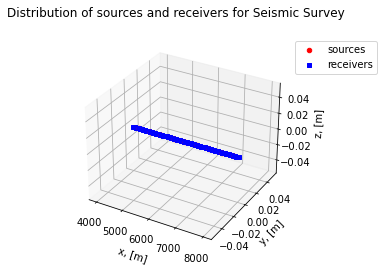

In [7]:
survey_config.plot_configuration()

#### Create System Model.

In [8]:
# Create system model
sm = SystemModel(model_kwargs=sm_model_kwargs)

#### Create and setup Seismic Data Container.
Seismic Data Container reads data from linked data files and output produced data for other components to use.

In [9]:
# Add data container
dc = sm.add_component_model_object(
    SeismicDataContainer(name='dc', parent=sm, survey_config=survey_config,
                         total_duration=2.5,
                         sampling_interval=0.002,
                         family=family, obs_name=obs_name,
                         data_directory=data_directory, data_setup=data_setup,
                         time_points=time_points, baseline=baseline,
                         data_reader=data_reader,
                         data_reader_kwargs=data_reader_kwargs,
                         presetup=True))

# Add parameters of the container
dc.add_par('index', value=scenarios[0],
           discrete_vals=[scenarios, num_scenarios*[1/num_scenarios]])

# Add gridded observation seismic
dc.add_grid_obs(obs_name, constr_type='matrix', output_dir=output_directory)
dc.add_grid_obs('delta_{}'.format(obs_name), constr_type='matrix',
                output_dir=output_directory)

#### Create and setup Seismic Monitoring.
Seismic Monitoring component inputs seismic data from Seismic Data Container and calculates NRMS and associated metrics.

In [10]:
# Add seismic monitoring technology
smt = sm.add_component_model_object(
    SeismicMonitoring(name='smt', parent=sm, survey_config=survey_config,
                      time_points=time_points))

# Add keyword arguments linked to the seismic data container outputs
smt.add_kwarg_linked_to_obs('data', dc.linkobs['seismic'], obs_type='grid')
smt.add_kwarg_linked_to_obs('baseline', dc.linkobs['baseline_seismic'], obs_type='grid')

# Add gridded observation
smt.add_grid_obs('NRMS', constr_type='matrix', output_dir=output_directory)

# Add scalar observations
for nm in ['ave_NRMS', 'max_NRMS', 'min_NRMS']:
    smt.add_obs(nm)
    smt.add_obs_to_be_linked(nm)

#### Run model as stochastic.

In [11]:
# Create sampleset varying over scenarios
samples = np.array(scenarios).reshape(num_scenarios, 1)
s = sm.create_sampleset(samples)

# Run sampleset
results = s.run(cpus=4, verbose=False)

#### Get selected data from saved files or directly from System Model.

In [12]:
# Get saved gridded observations from files
time_indices = list(range(num_time_points))
seismic = {}
delta_seismic = {}
nrms = {}
for rlzn_number, scen in enumerate(scenarios):
    print('Loading data for scenario {}...'.format(scen))
    seismic[scen] = sm.collect_gridded_observations_as_time_series(
        dc, 'seismic', output_directory, indices=time_indices, rlzn_number=rlzn_number+1)
    delta_seismic[scen] = sm.collect_gridded_observations_as_time_series(
        dc, 'delta_seismic', output_directory, indices=time_indices, rlzn_number=rlzn_number+1)
    nrms[scen] = sm.collect_gridded_observations_as_time_series(
        smt, 'NRMS', output_directory, indices=time_indices, rlzn_number=rlzn_number+1)

# Get scalar observations
out = s.collect_observations_as_time_series()

Loading data for scenario 12...
Loading data for scenario 109...
Loading data for scenario 622...
Loading data for scenario 141...
Loading data for scenario 318...
Loading data for scenario 881...
Loading data for scenario 986...
Loading data for scenario 22...
Loading data for scenario 76...
Loading data for scenario 269...


#### Plot results.

##### Seismic Data Container outputs: seismic data at several time points and sources.

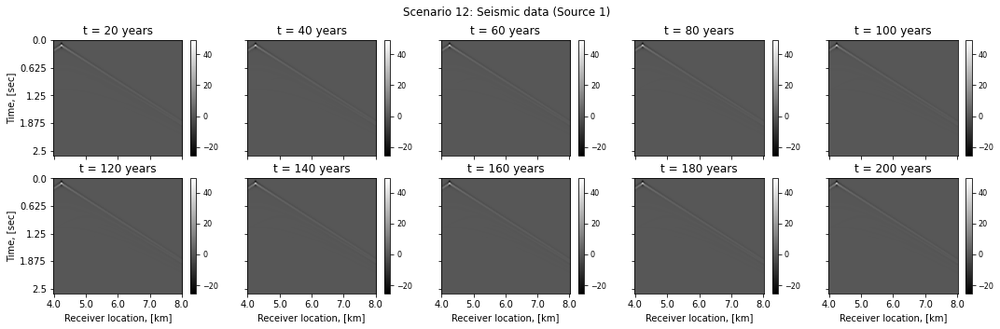

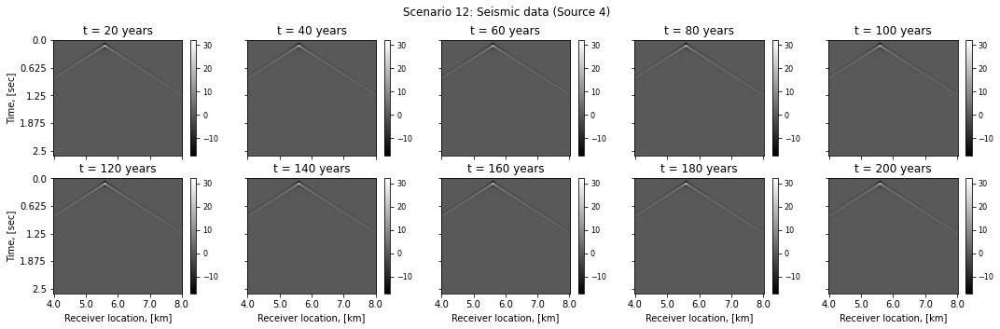

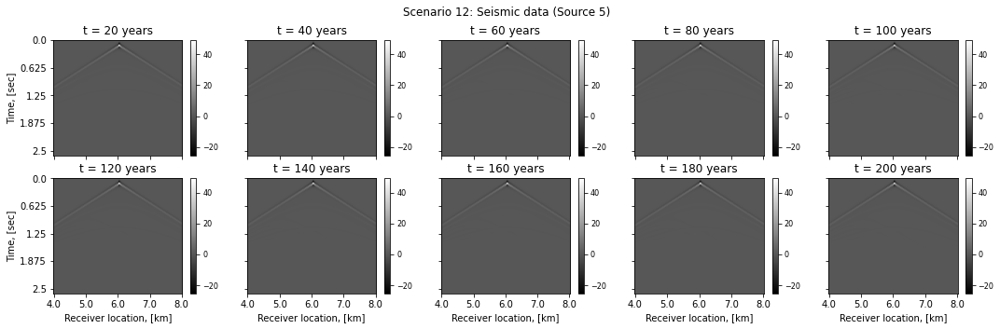

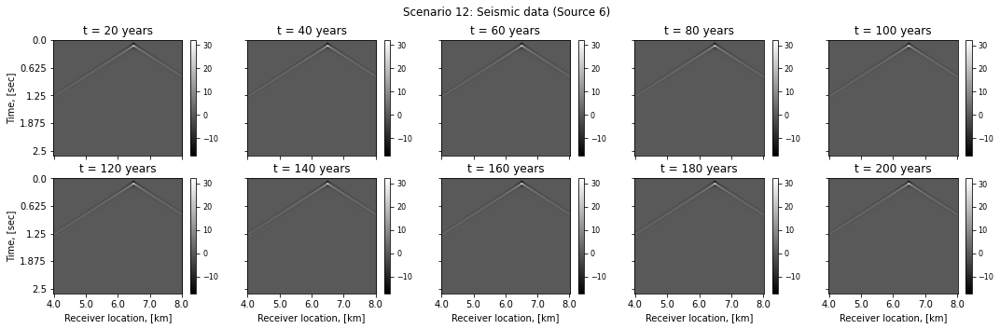

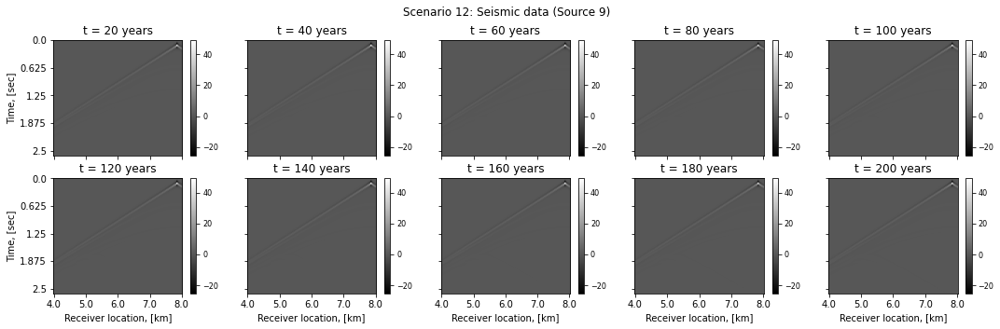

...

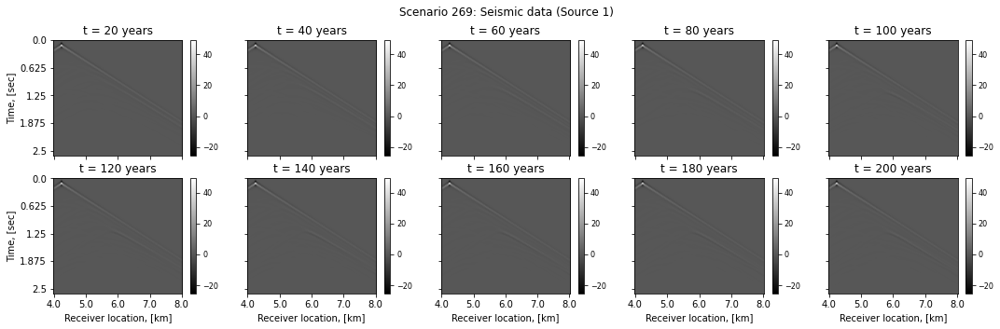

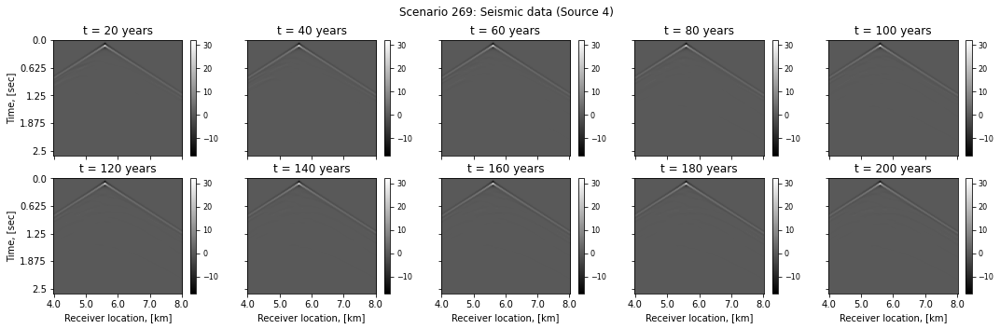

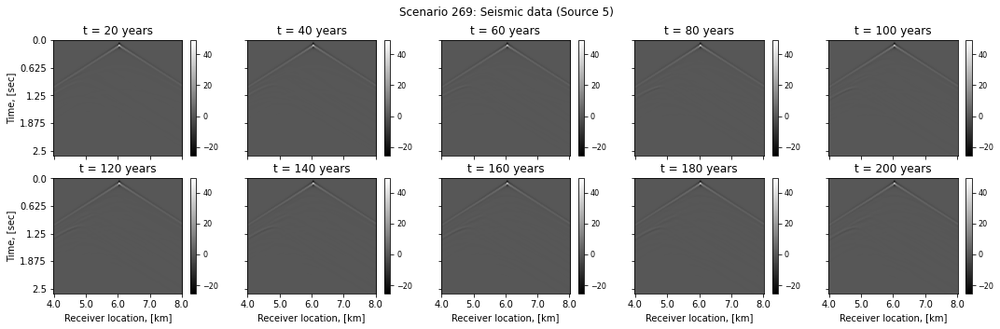

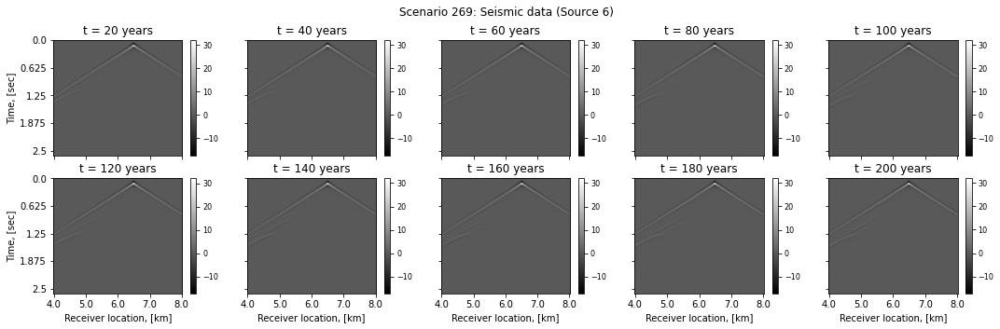

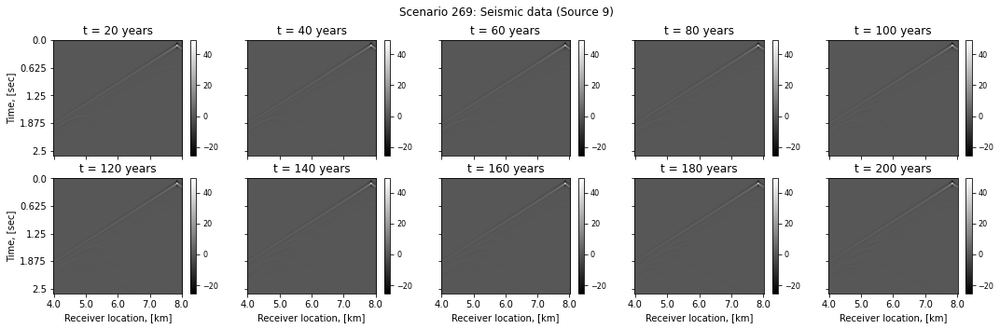

In [13]:
x = np.linspace(0, 100, num=5)
xlabels = 4+np.linspace(0, 4, num=5)
y = np.linspace(0, 1200, num=5)
ylabels = np.linspace(0, 2.5, num=5)
time_indices = range(1, 20, 2)
# Cycle over sources
for scen in scenarios:
    for source_ind in [1, 4, 5, 6, 9]:
        fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(18, 5),
                                    sharex=True, sharey=True)
        # Cycle over time indices
        for ind, time_ind in enumerate(time_indices):
            row = ind//5
            col = ind%5
            ax_im = axs[row, col].imshow(seismic[scen][time_ind][source_ind-1, :, :].T,
                                      cmap='gray', aspect='auto')
            axs[row, col].set_title('t = {} years'.format((time_ind + 1)*10))

            # Add colorbar
            color_bar = fig.colorbar(ax_im, ax=axs[row, col], orientation='vertical')
            color_bar.ax.tick_params(axis='y', which='major', labelsize=8)

        for row in range(2):
            axs[row, 0].set_yticks(y, labels=ylabels)
            axs[row, 0].set_ylabel('Time, [sec]')
        for col in range(5):
            axs[1, col].set_xticks(x, labels=xlabels)
            axs[1, col].set_xlabel('Receiver location, [km]')

        fig.suptitle('Scenario {}: Seismic data (Source {})'.format(
            scen, source_ind))

##### Seismic Data Container outputs: seismic data difference at several time points and sources.

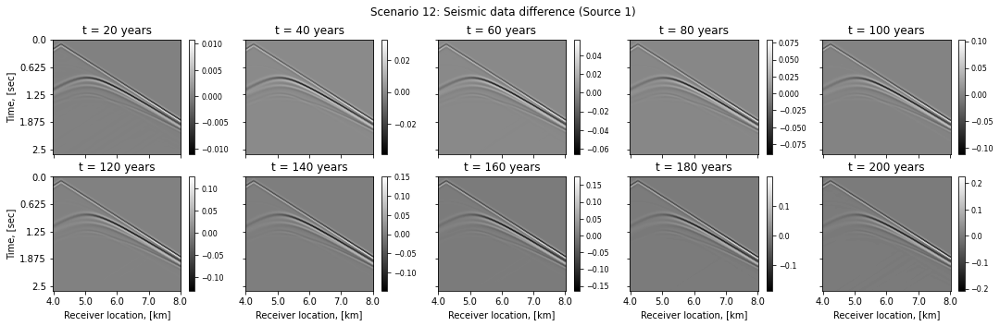

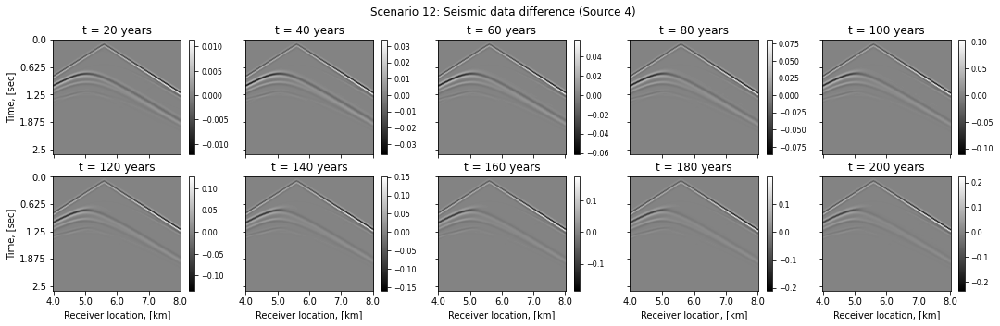

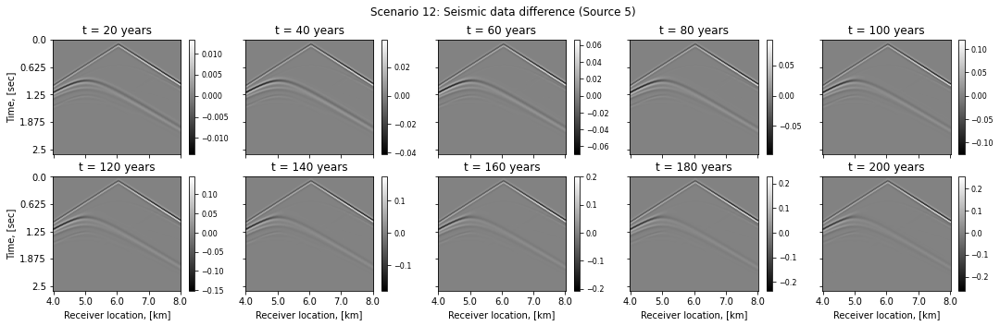

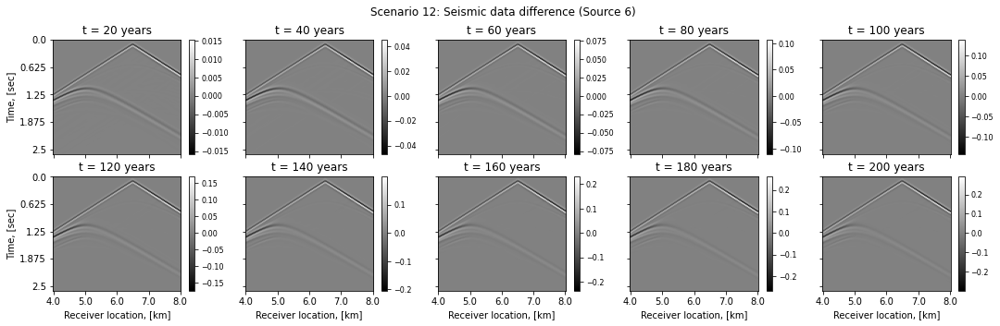

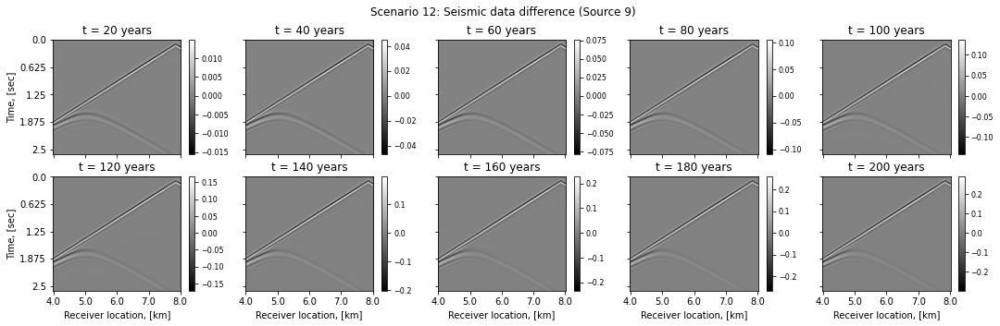

...

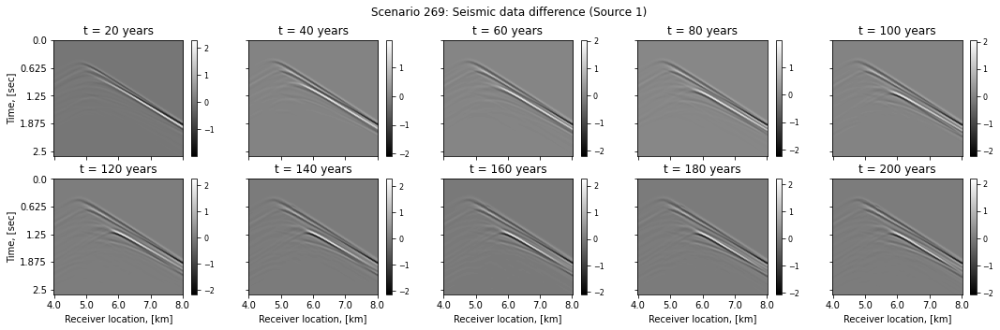

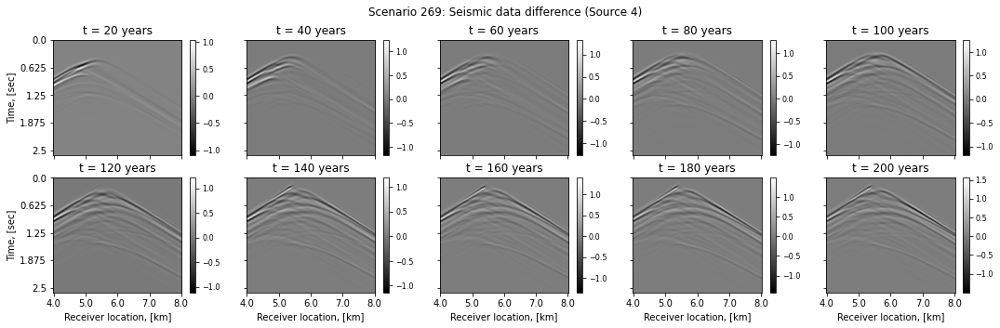

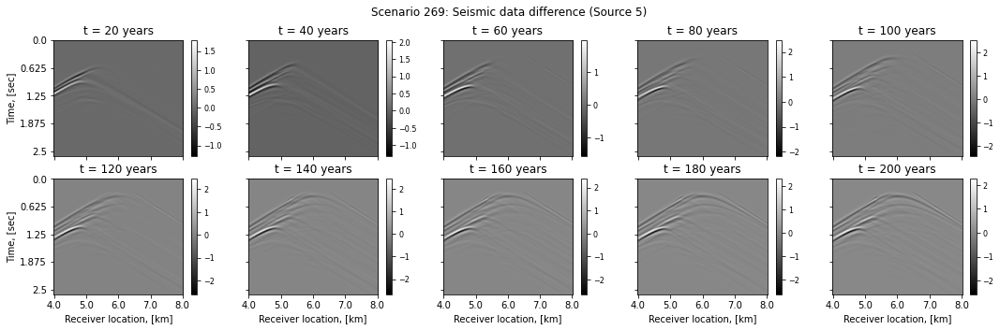

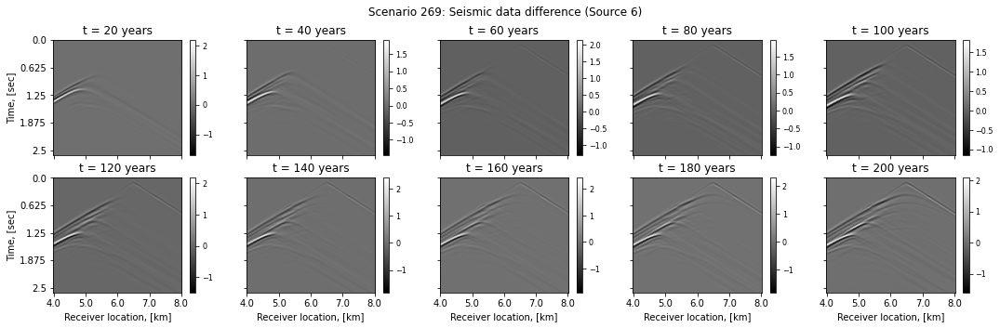

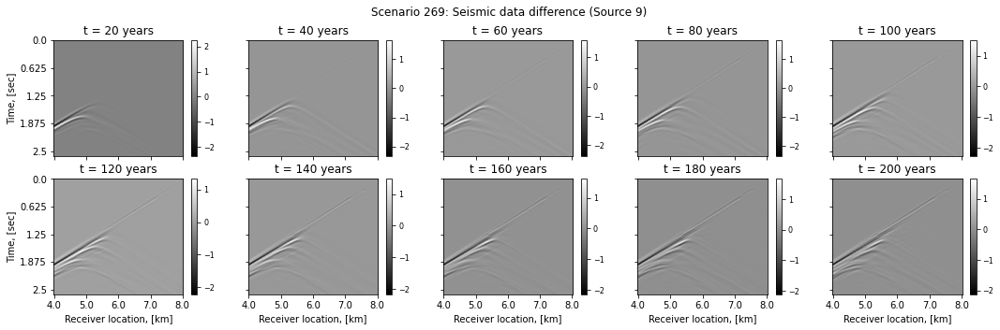

In [14]:
# Cycle over sources
for scen in scenarios:
    for source_ind in [1, 4, 5, 6, 9]:
        fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(18, 5),
                                    sharex=True, sharey=True)
        # Cycle over time indices
        for ind, time_ind in enumerate(time_indices):
            row = ind//5
            col = ind%5
            ax_im = axs[row, col].imshow(delta_seismic[scen][time_ind][source_ind-1, :, :].T,
                                         cmap='gray', aspect='auto')
            axs[row, col].set_title('t = {} years'.format((time_ind + 1)*10))

            # Add colorbar
            color_bar = fig.colorbar(ax_im, ax=axs[row, col], orientation='vertical')
            color_bar.ax.tick_params(axis='y', which='major', labelsize=8)

        for row in range(2):
            axs[row, 0].set_yticks(y, labels=ylabels)
            axs[row, 0].set_ylabel('Time, [sec]')
        for col in range(5):
            axs[1, col].set_xticks(x, labels=xlabels)
            axs[1, col].set_xlabel('Receiver location, [km]')

        fig.suptitle('Scenario {}: Seismic data difference (Source {})'.format(
            scen, source_ind))

##### Seismic Monitoring Component outputs: NRMS at several time points.

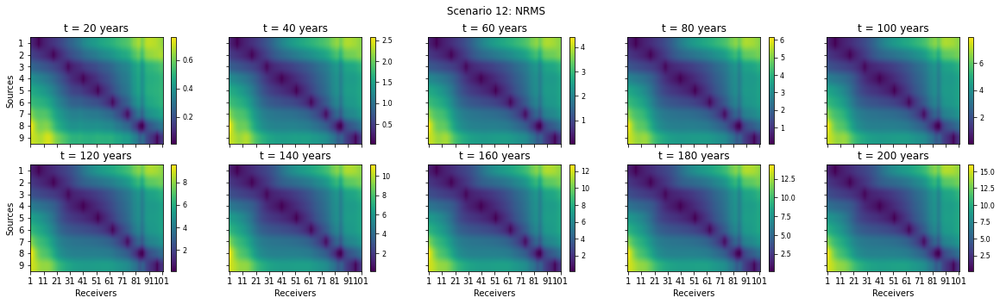

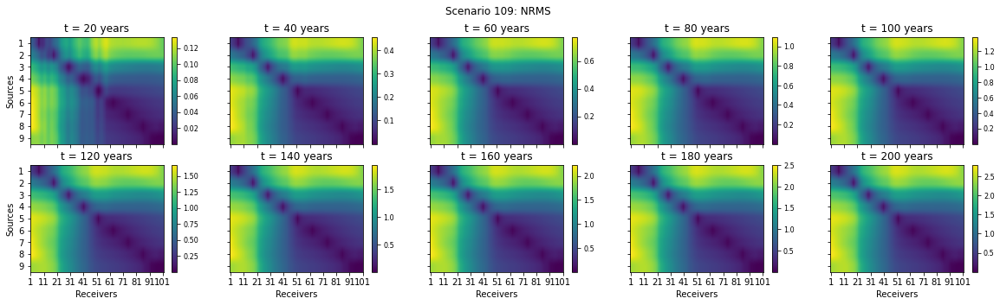

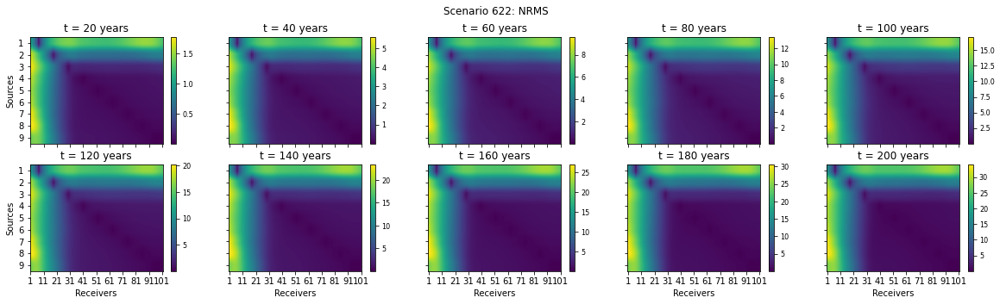

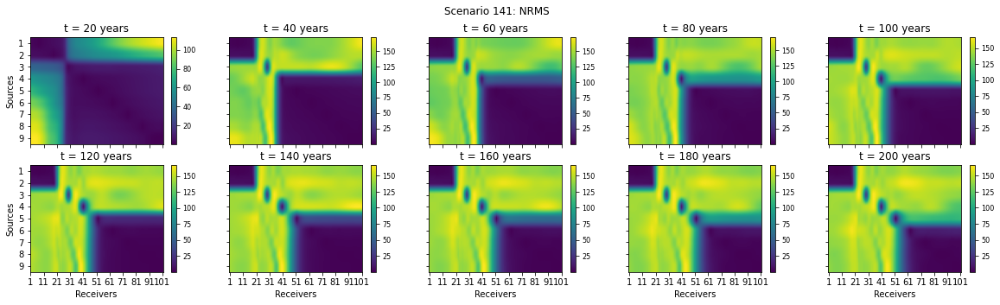

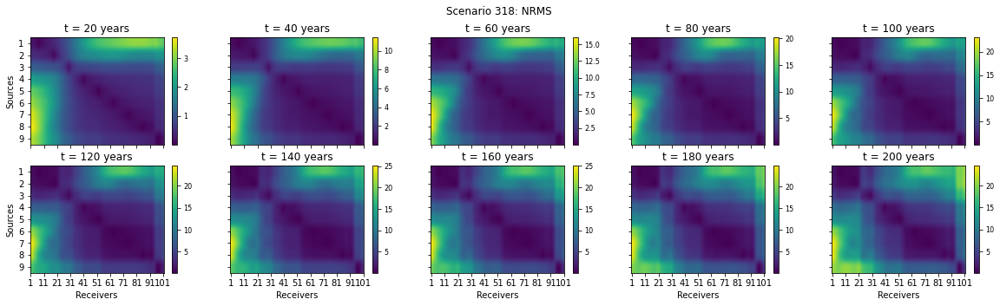

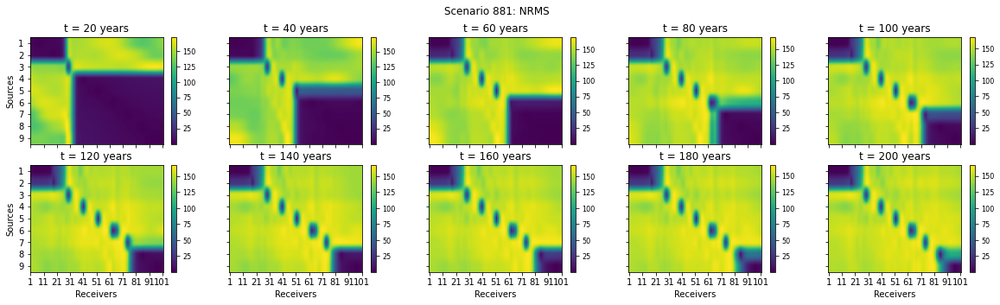

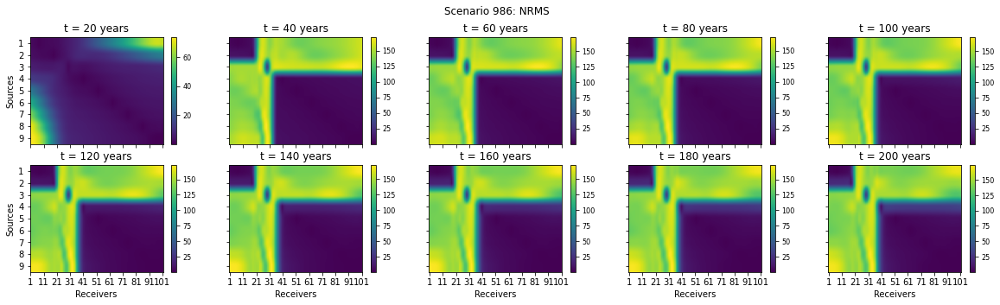

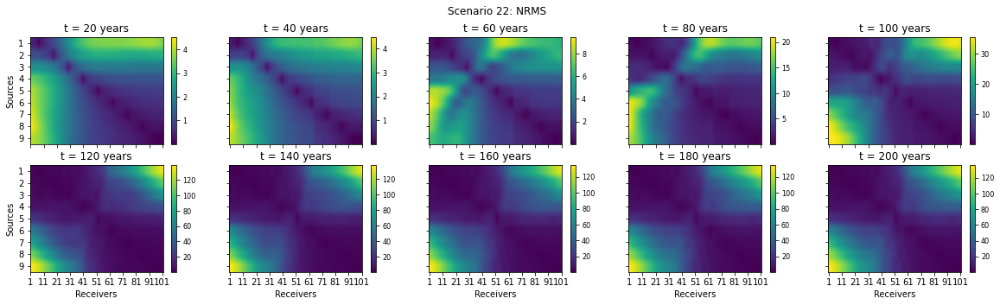

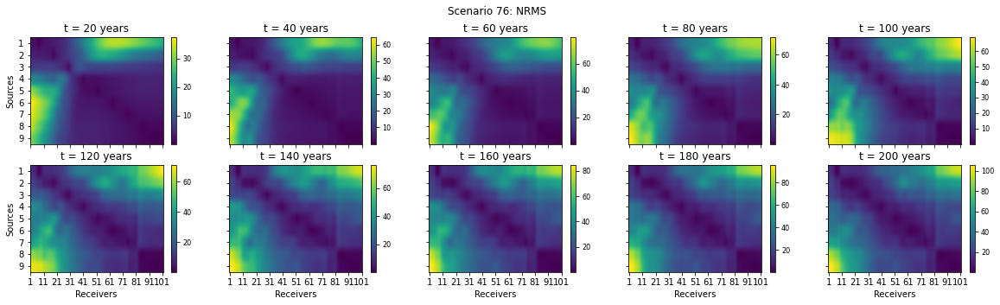

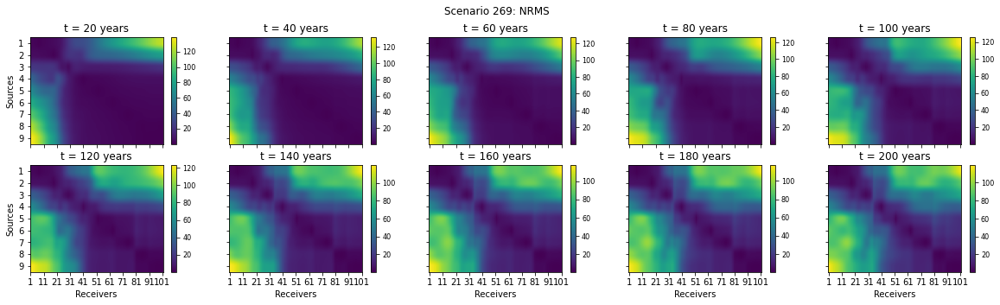

In [15]:
x = np.linspace(0, 100, num=11)
xlabels = np.linspace(1, 101, num=11, dtype=int)
y = np.linspace(0, 8, num=9)
ylabels = np.linspace(1, 9, num=9, dtype=int)
# Cycle over sources
for scen in scenarios:
    fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(20, 5),
                            sharex=True, sharey=True)
    # Cycle over time indices
    for ind, time_ind in enumerate(time_indices):
        row = ind//5
        col = ind%5
        ax_im = axs[row, col].imshow(nrms[scen][time_ind],
                                     cmap='viridis', aspect='auto')
        axs[row, col].set_title('t = {} years'.format((time_ind + 1)*10))

        # Add colorbar
        color_bar = fig.colorbar(ax_im, ax=axs[row, col], orientation='vertical')
        color_bar.ax.tick_params(axis='y', which='major', labelsize=8)

    # Set x-labels
    for col in range(5):
        axs[1, col].set_xticks(x, labels=xlabels)
        axs[1, col].set_xlabel('Receivers')

    # Set y-labels
    for row in range(2):
        axs[row, 0].set_yticks(y, labels=ylabels)
        axs[row, 0].set_ylabel('Sources')

    fig.suptitle('Scenario {}: NRMS'.format(scen))
